In [ ]:
# Install libraries
!pip install huggingface_hub soundfile scikit-learn numpy torchaudio

In [ ]:
# Download model.py
import urllib.request
print("Downloading the correct model script...")
urllib.request.urlretrieve(
    "https://huggingface.co/lab260/Spectra-AASIST3/raw/main/model.py",
    "model.py"
)

('model.py', <http.client.HTTPMessage at 0x7d6be0b1ddf0>)

In [ ]:
# Download the specific ASVspoof5 evaluation keys and one subset archive
from huggingface_hub import hf_hub_download
import tarfile
import os

print("Downloading ASVspoof5 protocols and evaluation split part 'aa'...")
protocol_path = hf_hub_download(repo_id="jungjee/asvspoof5", filename="ASVspoof5_protocols.tar", repo_type="dataset")
eval_subset_path = hf_hub_download(repo_id="jungjee/asvspoof5", filename="flac_E_aa.tar", repo_type="dataset")

# Extract the protocol files to read labels
print("Extracting protocol files...")
with tarfile.open(protocol_path, "r") as tar:
    tar.extractall(path="./asvspoof5_protocols")

# Extract the audio files
print("Extracting audio split (this can take a few minutes)...")
with tarfile.open(eval_subset_path, "r") as tar:
    tar.extractall(path="./asvspoof5_audio")

print("Setup completed successfully!")

Extracting protocol files...


/tmp/ipykernel_1074/2120123487.py:13: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path="./asvspoof5_protocols")


Extracting audio split (this can take a few minutes)...


/tmp/ipykernel_1074/2120123487.py:18: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path="./asvspoof5_audio")


Setup completed successfully!


In [ ]:
import os
import torch
import soundfile as sf
import numpy as np

# Import the class directly from the downloaded model.py
from model import SpectraAASIST3

# 1. Initialize and load the model directly from the Hugging Face hub
print("Loading Pretrained Spectra-AASIST3 model weights...")
device = "cuda" if torch.cuda.is_available() else "cpu"
model = SpectraAASIST3.from_pretrained("lab260/Spectra-AASIST3")
model.to(device)
model.eval()

Loading Pretrained Spectra-AASIST3 model weights...


Loading weights:   0%|          | 0/422 [00:00<?, ?it/s]

[transformers] Wav2Vec2Model LOAD REPORT from: facebook/wav2vec2-xls-r-300m
Key                          | Status     |  | 
-----------------------------+------------+--+-
project_hid.bias             | UNEXPECTED |  | 
quantizer.codevectors        | UNEXPECTED |  | 
project_q.bias               | UNEXPECTED |  | 
quantizer.weight_proj.bias   | UNEXPECTED |  | 
project_hid.weight           | UNEXPECTED |  | 
quantizer.weight_proj.weight | UNEXPECTED |  | 
project_q.weight             | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


SpectraAASIST3(
  (ssl_encoder): Wav2Vec2Encoder(
    (model): Wav2Vec2Model(
      (feature_extractor): Wav2Vec2FeatureEncoder(
        (conv_layers): ModuleList(
          (0): Wav2Vec2LayerNormConvLayer(
            (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,))
            (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (activation): GELUActivation()
          )
          (1-4): 4 x Wav2Vec2LayerNormConvLayer(
            (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,))
            (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (activation): GELUActivation()
          )
          (5-6): 2 x Wav2Vec2LayerNormConvLayer(
            (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,))
            (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (activation): GELUActivation()
          )
        )
      )
      (feature_projection): Wav2Vec2FeatureProjection(
        (layer

In [ ]:
# Locate the evaluation protocol map
protocol_file = "/content/asvspoof5_protocols/ASVspoof5.eval.track_1.tsv"
print(f"Using protocol file: {protocol_file}")

Using protocol file: /content/asvspoof5_protocols/ASVspoof5.eval.track_1.tsv


In [ ]:
# Parse target labels (Mapping: bonafide = 1, spoof = 0)
labels_dict = {}
with open(protocol_file, 'r') as f:
    for line in f:
        parts = line.strip().split()
        if len(parts) >= 9:
            file_id = parts[1].strip()     # Column 2: e.g., E_0000000024
            label_tag = parts[8].strip()   # Column 9: 'bonafide' or 'spoof'
            labels_dict[file_id] = 1 if label_tag == "bonafide" else 0

In [ ]:
labels_dict.items()

dict_items([('E_0009538969', 0), ('E_0009249178', 0), ('E_0004993854', 1), ('E_0006624752', 0), ('E_0007708293', 0), ('E_0006397484', 0), ('E_0006028981', 1), ('E_0007218111', 0), ('E_0004684376', 0), ('E_0009977947', 1), ('E_0003758851', 0), ('E_0000018288', 0), ('E_0008001205', 0), ('E_0004513239', 0), ('E_0003351162', 1), ('E_0000778532', 0), ('E_0002864934', 0), ('E_0008174851', 0), ('E_0001635161', 0), ('E_0000040212', 0), ('E_0004572489', 0), ('E_0008665728', 0), ('E_0006427894', 0), ('E_0003098390', 0), ('E_0005536658', 0), ('E_0003755167', 0), ('E_0007105493', 0), ('E_0000540119', 0), ('E_0005789289', 1), ('E_0006731508', 0), ('E_0006690576', 0), ('E_0000876598', 0), ('E_0001758424', 0), ('E_0001821514', 0), ('E_0000502309', 1), ('E_0006297507', 0), ('E_0005894640', 0), ('E_0005755392', 0), ('E_0005909570', 0), ('E_0003091539', 0), ('E_0005124619', 1), ('E_0007076178', 0), ('E_0004998193', 0), ('E_0000910678', 0), ('E_0005242022', 0), ('E_0009729190', 0), ('E_0002286370', 0), (

In [ ]:
# This is our distribution of dataset

total_audio = len(labels_dict)
total_bonafide = sum(labels_dict.values())
total_spoof = total_audio - total_bonafide

print(f"Total Bonafide (Real) : {total_bonafide:,}")
print(f"Total Spoof    (Fake) : {total_spoof:,}")
print(f"Total Entries         : {total_audio:,}")

Total Bonafide (Real) : 138,688
Total Spoof    (Fake) : 542,086
Total Entries         : 680,774


In [ ]:
# Lets see what does each file contain.

data, sample_rate = sf.read("/content/asvspoof5_audio/flac_E_eval/E_0000000024.flac", dtype='float32')
print(f"Shape of audio file: {data.shape}")
print(f"Sampling rate: {sample_rate}")
print(f"Audio duration: {data.shape[0] / sample_rate}s")

Shape of audio file: (66480,)
Sampling rate: 16000
Audio duration: 4.155s


In [ ]:
import os
import glob
import torch
import soundfile as sf
import numpy as np
from torch.utils.data import Dataset, DataLoader

class ASVspoof5Dataset(Dataset):
    """
    A Dataset that targets the exact subdirectory containing flac files
    to eliminate slow disk scanning.
    """
    def __init__(self, audio_dir, labels_dict, max_eval_files=10000):
        self.audio_dir = audio_dir
        self.labels_dict = labels_dict

        # Target any flac files within the directory or its immediate subdirectories
        search_path = os.path.join(audio_dir, "**", "*.flac")
        all_flac_paths = glob.glob(search_path, recursive=True)

        # Track true distribution values during initialization
        self.valid_files = []
        self.actual_bonafide = 0
        self.actual_spoof = 0

        # Match against protocol labels and slice to target evaluation size
        for file_path in all_flac_paths:
            fname = os.path.basename(file_path)
            file_id = os.path.splitext(fname)[0]
            if file_id in labels_dict:
                self.valid_files.append((file_path, file_id))

                # Increment counts based on protocol labels
                if labels_dict[file_id] == 1:
                    self.actual_bonafide += 1
                else:
                    self.actual_spoof += 1

                if len(self.valid_files) >= max_eval_files:
                    break

        print(f"Pipeline ready. Evaluated subset size capped at: {len(self.valid_files):,}")

    def __len__(self):
        return len(self.valid_files)

    @staticmethod
    def _pad_trim_audio(data, target_length=64600):
        """Standardizes audio array length through looping or truncation."""
        if len(data) < target_length:
            repeats = int(np.ceil(target_length / len(data)))
            return np.tile(data, repeats)[:target_length]
        return data[:target_length]

    def __getitem__(self, idx):
        file_path, file_id = self.valid_files[idx]

        # Load raw audio track
        data, _ = sf.read(file_path, dtype='float32')
        data = self._pad_trim_audio(data)

        return torch.FloatTensor(data), self.labels_dict[file_id]


def run_evaluation(model, data_loader, device):
    """
    Executes batched, parallel inference over the dataset using the GPU hardware.
    """
    model.eval()
    y_true, y_scores = [], []

    print("Inference engine started...")
    with torch.no_grad():
        for batch_idx, (audios, labels) in enumerate(data_loader):
            # Move memory pages to GPU at once using asynchronous memory pins
            audios = audios.to(device, non_blocking=True)

            # Forward pass matrix arithmetic
            logits = model(audios)

            # Extract Class 1 values (Bonafide logit confidence scores)
            scores = logits[:, 1].cpu().numpy()

            y_true.extend(labels.numpy())
            y_scores.extend(scores)

            if (batch_idx + 1) % 20 == 0:
                total_done = (batch_idx + 1) * data_loader.batch_size
                print(f"Processed {total_done:,} / {len(data_loader.dataset):,} tracks...")

    return np.array(y_true), np.array(y_scores)


# 1. Instantiate dataset with a cap
eval_dataset = ASVspoof5Dataset(
    audio_dir="./asvspoof5_audio",
    labels_dict=labels_dict,
    max_eval_files=100000
)

# 2. Print distribution directly using the properties computed by the class object
print(f"Total Bonafide (Real) : {eval_dataset.actual_bonafide:,}")
print(f"Total Spoof    (Fake) : {eval_dataset.actual_spoof:,}")
print(f"Total Entries         : {len(eval_dataset):,}\n")

# 3. Build the parallel data loader configuration
eval_loader = DataLoader(
    eval_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

# 4. Trigger evaluation execution over the entire disk sample
y_true, y_scores = run_evaluation(model, eval_loader, device)
print(f"\nExecution complete. Processed {len(y_true):,} files successfully.")

Pipeline ready. Evaluated subset size capped at: 68,188
Inference engine started...
Processed 1,280 / 68,188 tracks...
Processed 2,560 / 68,188 tracks...
Processed 3,840 / 68,188 tracks...
Processed 5,120 / 68,188 tracks...
Processed 6,400 / 68,188 tracks...
Processed 7,680 / 68,188 tracks...
Processed 8,960 / 68,188 tracks...
Processed 10,240 / 68,188 tracks...
Processed 11,520 / 68,188 tracks...
Processed 12,800 / 68,188 tracks...
Processed 14,080 / 68,188 tracks...
Processed 15,360 / 68,188 tracks...
Processed 16,640 / 68,188 tracks...
Processed 17,920 / 68,188 tracks...
Processed 19,200 / 68,188 tracks...
Processed 20,480 / 68,188 tracks...
Processed 21,760 / 68,188 tracks...
Processed 23,040 / 68,188 tracks...
Processed 24,320 / 68,188 tracks...
Processed 25,600 / 68,188 tracks...
Processed 26,880 / 68,188 tracks...
Processed 28,160 / 68,188 tracks...
Processed 29,440 / 68,188 tracks...
Processed 30,720 / 68,188 tracks...
Processed 32,000 / 68,188 tracks...
Processed 33,280 / 68,1

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve

# Define function to extract the Equal Error Rate (EER) threshold score intercept point
def compute_eer(true_labels, predicted_scores):
    fpr, tpr, thresholds = roc_curve(true_labels, predicted_scores, pos_label=1)
    fnr = 1 - tpr
    idx = np.nanargmin(np.abs(fpr - fnr))
    eer = (fpr[idx] + fnr[idx]) / 2
    optimal_threshold = thresholds[idx]
    return eer * 100, optimal_threshold

# Compute validation benchmarks
eer_val, optimal_threshold = compute_eer(np.array(y_true), np.array(y_scores))

In [ ]:
# Derive hard binary classifications relative to calculated threshold boundary markers
y_pred = [1 if score >= optimal_threshold else 0 for score in y_scores]

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Print out metric statistics report layout
print("\n" + "="*50)
print("     SPEECH ANTI-SPOOFING MODEL PERFORMANCE")
print("="*50)
print(f"Accuracy                  : {accuracy * 100:.2f}%")
print(f"Precision                 : {precision * 100:.2f}%")
print(f"Recall (Sensitivity)      : {recall * 100:.2f}%")
print(f"F1-Score                  : {f1 * 100:.2f}%")
print(f"Equal Error Rate (EER)    : {eer_val:.2f}%")
print(f"Calculated Target Cut-off : {optimal_threshold:.4f}")
print("="*50)


     SPEECH ANTI-SPOOFING MODEL PERFORMANCE
Accuracy                  : 84.92%
Precision                 : 59.63%
Recall (Sensitivity)      : 84.91%
F1-Score                  : 70.06%
Equal Error Rate (EER)    : 15.08%
Calculated Target Cut-off : -0.5896


# **Visualize**

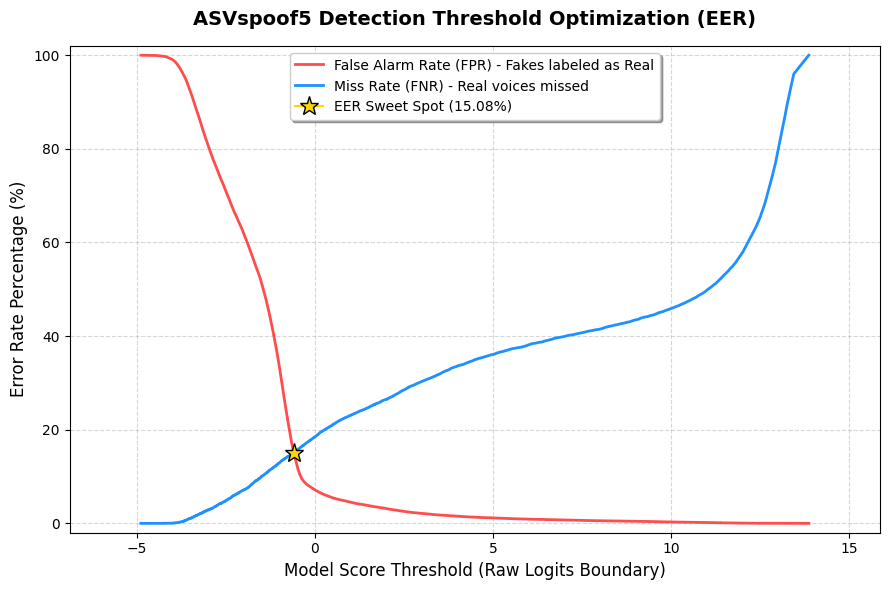

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
import numpy as np

# 1. Re-calculate the curves for plotting
fpr, tpr, thresholds = roc_curve(y_true, y_scores, pos_label=1)
fnr = 1 - tpr

# Find the exact EER index point again
idx = np.nanargmin(np.abs(fpr - fnr))
eer_point = fpr[idx] * 100
eer_threshold = thresholds[idx]

# 2. Initialize the plot layout dimensions
plt.figure(figsize=(9, 6))

# Plot False Alarm Rate vs Miss Rate curves
plt.plot(thresholds, fpr * 100, label='False Alarm Rate (FPR) - Fakes labeled as Real', color='#ff4d4d', linewidth=2)
plt.plot(thresholds, fnr * 100, label='Miss Rate (FNR) - Real voices missed', color='#1e90ff', linewidth=2)

# Highlight the Equal Error Rate intersection point
plt.plot(eer_threshold, eer_point, marker='*', color='gold', markersize=14,
         markeredgecolor='black', label=f'EER Sweet Spot ({eer_point:.2f}%)')

# 3. Add visual chart labels and guides
plt.title('ASVspoof5 Detection Threshold Optimization (EER)', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Model Score Threshold (Raw Logits Boundary)', fontsize=12)
plt.ylabel('Error Rate Percentage (%)', fontsize=12)

# Zoom into the operational zone (removes runaway infinity values from thresholds axis)
# Adjust bounds dynamically based on your score spread
clean_scores = [s for s in y_scores if not np.isinf(s)]
if clean_scores:
    plt.xlim(min(clean_scores) - 2, max(clean_scores) + 2)

plt.ylim(-2, 102)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc='upper center', fontsize=10, frameon=True, shadow=True)

# Show the plot
plt.tight_layout()
plt.show()